<a href="https://colab.research.google.com/github/FukuokaIruka/Ex3/blob/main/jikken3_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 実験３: Generative Adversarial Networks (GANs)

## GANとは何か？
GAN（Generative Adversarial Network：敵対的生成ネットワーク）は、新しいデータを生成するための深層学習モデルです。
画像生成やデータ拡張、スタイル変換など、さまざまな生成タスクで活躍しています。

GANは、2つのネットワークを組み合わせて学習を行います：

* Generator（生成器）
  * ランダムなノイズから、本物らしいデータを生成しようとする
  * 偽の画像をうまく作って識別器を騙そうとする
* Discriminator（識別器）
  * 入力されたデータが「本物（訓練データ）か、偽物（生成されたデータ）か」を判定する
  * 画像が本物か偽物かを見抜こうとする

この2つは、まるで詐欺師と鑑定士のような関係です。
この2つが互いに競い合うことで、生成器は本物そっくりのデータを作れるように成長していきます。

最初は、生成器は「ノイズにしか見えない画像」を出力します。
しかし、識別器がそれを見抜くことで、生成器は少しずつ学習して本物に近づけていくのです。
このプロセスが繰り返されることで、最終的には人間が見ても本物と見分けがつかない画像を生成できるようになります。

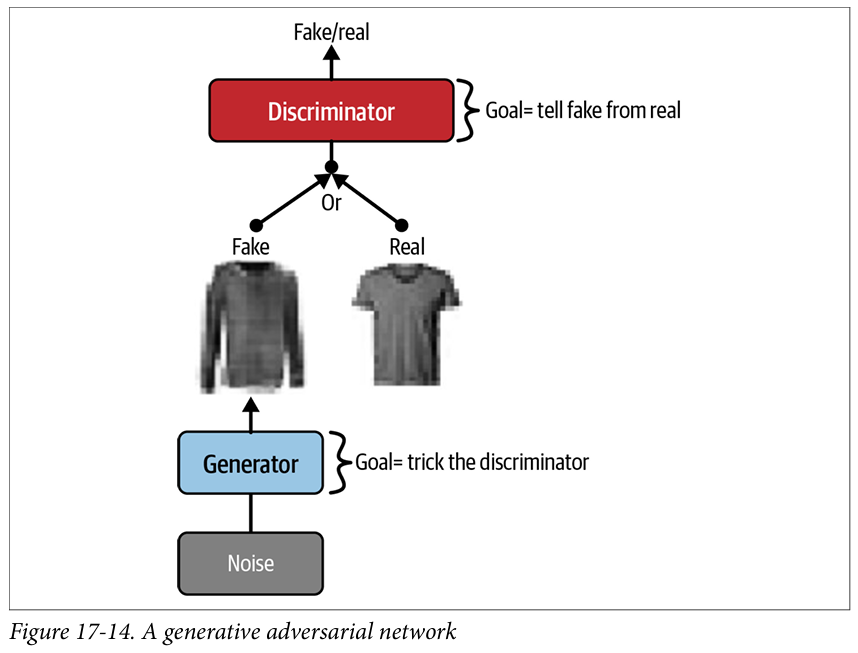

### 潜在空間と生成の仕組み（VAEとの類似点）

生成器の入力は、通常正規分布（ガウス分布）に従うランダムなベクトルです。
このベクトルは、**潜在空間（latent space）**における「コード」のようなものであり、VAEの潜在ベクトルとよく似ています。

* VAE：画像を圧縮 → 潜在ベクトル（z） → 復元
* GAN：ランダムな潜在ベクトル（z） → 新しい画像を生成

このように、**「潜在空間から画像を生成する」**という考え方は、VAEとGANで共通しています。

### GANの学習の流れ
GANの学習では、生成器（Generator）と識別器（Discriminator）を交互に訓練していきます。
それぞれのネットワークは「相手を出し抜こう」とする立場にあるため、まるでゲームのような学習構造になっています。

#### 1. 識別器の訓練

まずは、**識別器（Discriminator）**から訓練を行います。
* 本物の画像（訓練データ）には 「1（real）」 というラベルを与える
* 生成器が作った偽物の画像には 「0（fake）」 のラベルを与える
* 識別器はこの2種類を見分けるように訓練されます

この段階では、生成器はまだ訓練されていないので、偽物の画像は「いかにも偽物」ですが、
それをうまく見抜けるように識別器のパラメータを更新していきます。
生成器のパラメータ（重み）は更新しません。

#### 2. 生成器の訓練

次に、**生成器（Generator）**を訓練します。
* ランダムなノイズベクトル z を生成器に入力し、画像を出力する
* その画像を識別器に渡して、「これは本物だと判定させる」ように訓練する

ここで重要なのは、識別器の重みは固定したまま、生成器のパラメータだけを更新するという点です。
つまり生成器の損失関数は：

「識別器に『これは本物だ』と誤認させる確率を最大化する」こと

#### 交互に訓練
この2つのステップを 交互に繰り返すことで：

* 識別器は、「偽物を見抜く力」をつけていき
* 生成器は、「バレないようにリアルな画像を作る力」を磨いていきます

このような「騙す vs 見抜く」の競争を通じて、両者が少しずつ進化し、質の高い画像生成が可能になるのです。

## GANは「ゼロサムゲーム」
GANの学習は、生成器と識別器が対戦するゲームとして捉えることができます。
これは、一方が得をすれば、もう一方が損をするというタイプのゲーム、つまり**ゼロ和ゲーム（zero-sum game）**です。

* 生成器が「よりリアルな画像」を作って騙せれば、自分の勝ち
* 識別器が「それは偽物だ」と見破れば、自分の勝ち

このような競争が繰り返されることで、両者は少しずつお互いに適応しながら学習を続けます。

### ナッシュ均衡
このようなゲームが十分に進んだ状態では、
どちらのプレイヤーも「これ以上、自分だけが一方的に有利になる戦略変更ができない」
という安定した状態に到達することがあります。
これを**ナッシュ均衡（Nash equilibrium）**と呼びます。

例：道路の運転ルール

ナッシュ均衡を直感的に理解するために、運転の例を考えてみましょう。
すべてのドライバーが左側通行を守っているとします（日本など）。
このとき、「自分ひとりだけ右側通行に変える」ことは非常に危険です。
たとえ道路の作りが左右対称でも、一人だけが戦略を変えるメリットはない。

このように「誰も戦略を変えようとしない状況」がナッシュ均衡です。

### GANにおけるナッシュ均衡
GANの訓練が進むと：
* 生成器は、識別器に騙されない画像をうまく作れるようになり
* 識別器は、その画像が本物か偽物かをギリギリで見分けられるかどうかという状態になります

このとき、両者が戦略を変えてもそれぞれの成功率は大きく変わらない状態になります。
これが、GANにおけるナッシュ均衡です。

ただし、実際の学習ではこの状態に正確に到達するのは難しく、多くの場合は近似的な均衡状態を目指します。

## GAN の実装

まずはライブラリーの導入

In [ ]:
import sys
from packaging import version

import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"
import tf_keras

import tensorflow as tf

assert version.parse(tf.__version__) >= version.parse("2.8.0")

2025-05-25 22:30:29.355052: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-25 22:30:29.362073: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748179829.369803    4049 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748179829.372138    4049 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1748179829.378797    4049 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

Fashion-MNIST データセットの導入と訓練、検証データに分ける

In [ ]:
import numpy as np

fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

絵を描く関数の定義：

In [ ]:
import matplotlib.pyplot as plt

def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

生成器と識別器の定義：

In [ ]:
tf.random.set_seed(15)  # extra code – ensures reproducibility on CPU

codings_size = 30

Dense = tf.keras.layers.Dense
generator = tf.keras.Sequential([
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(28 * 28, activation="sigmoid"),
    tf.keras.layers.Reshape([28, 28])
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

I0000 00:00:1748179870.974749    4049 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13553 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Ti SUPER, pci bus id: 0000:01:00.0, compute capability: 8.9


モデルのコンパイルを行う

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

トレーニングを行う

**CPUでやる場合、30分以上かかる**

Epoch 1/50


I0000 00:00:1748179882.918998    4117 service.cc:152] XLA service 0x7fad6dc0ea90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748179882.919029    4117 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Ti SUPER, Compute Capability 8.9
2025-05-25 22:31:22.922794: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1748179882.928666    4117 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1748179882.981301    4117 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2025-05-25 22:31:52.782127: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


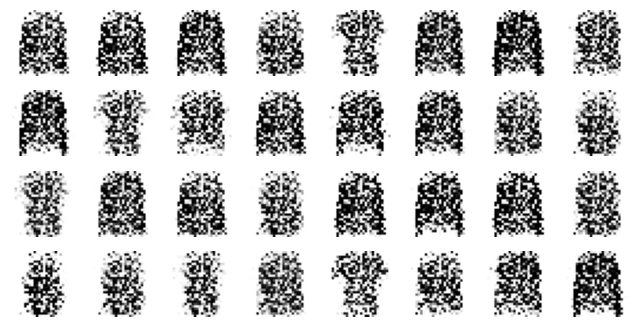

Epoch 2/50


2025-05-25 22:32:22.120819: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


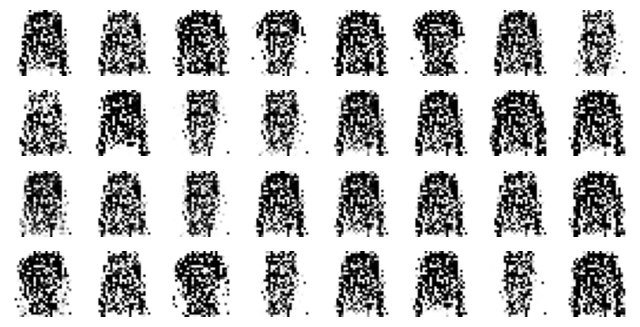

Epoch 3/50


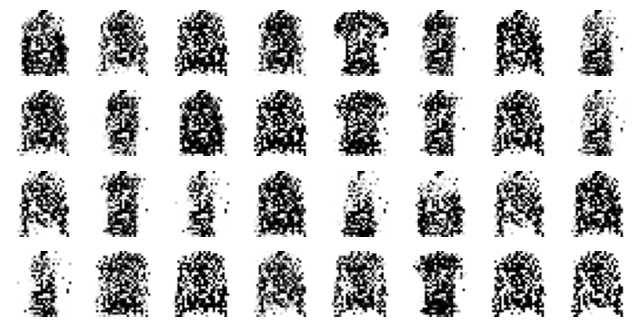

Epoch 4/50


2025-05-25 22:33:20.689289: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


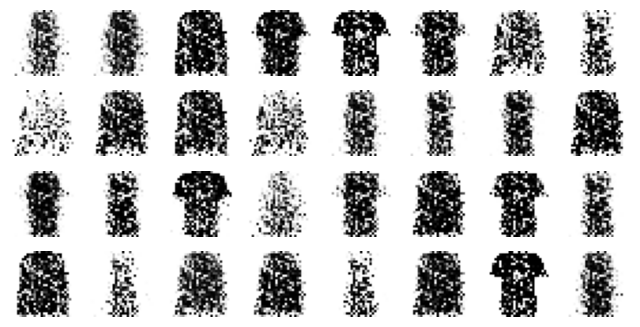

Epoch 5/50


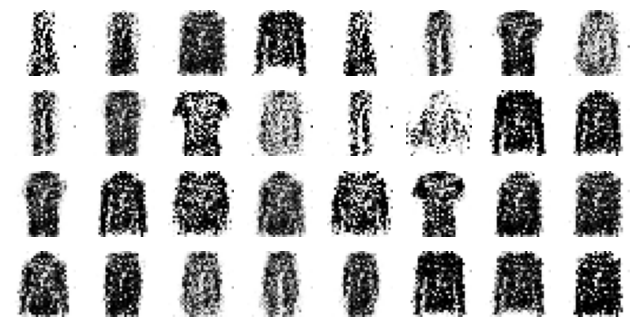

Epoch 6/50


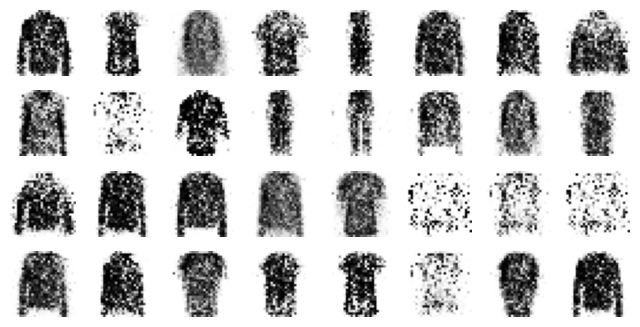

Epoch 7/50


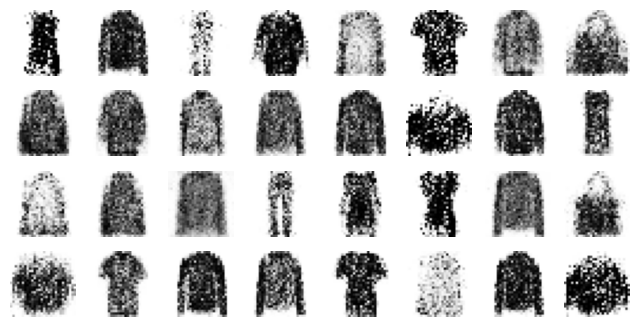

Epoch 8/50


2025-05-25 22:35:13.784047: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


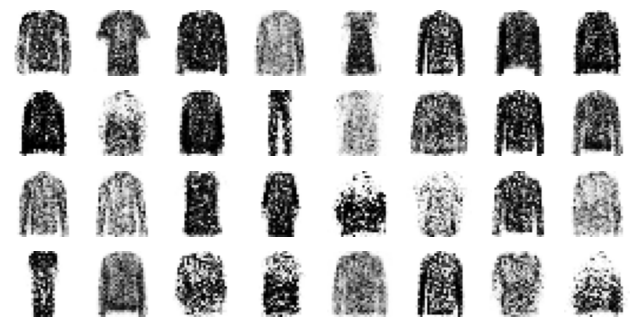

Epoch 9/50


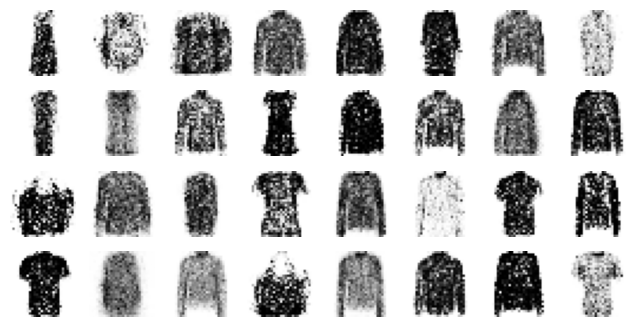

Epoch 10/50


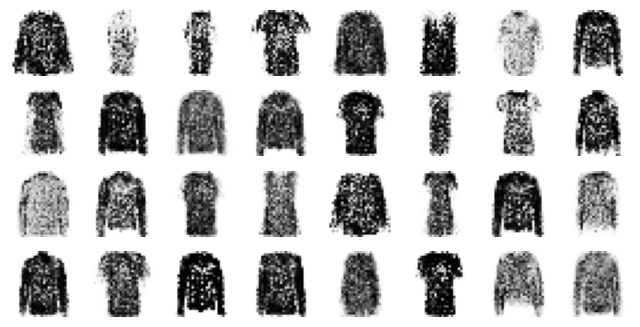

Epoch 11/50


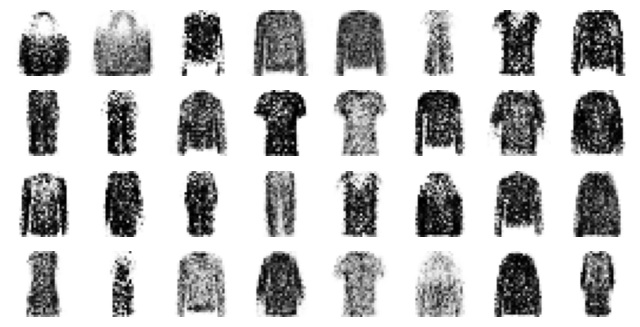

Epoch 12/50


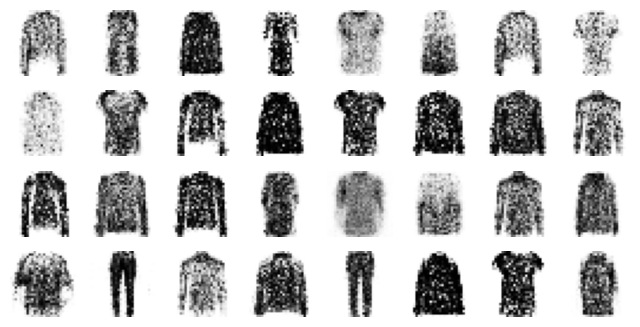

Epoch 13/50


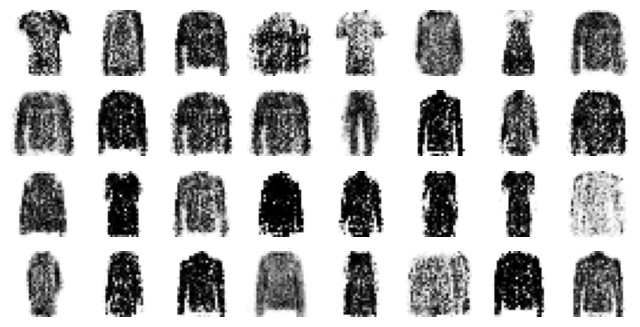

Epoch 14/50


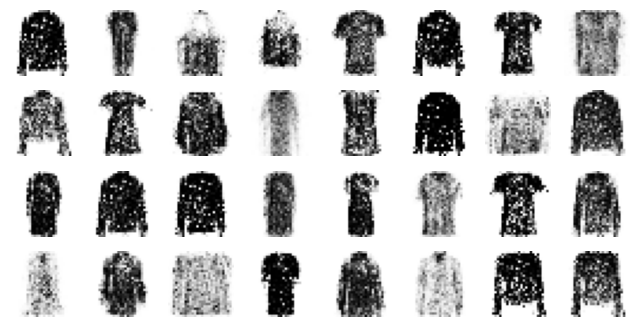

Epoch 15/50


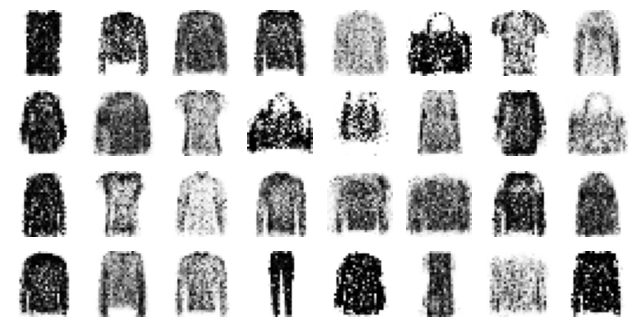

Epoch 16/50


2025-05-25 22:39:05.455888: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


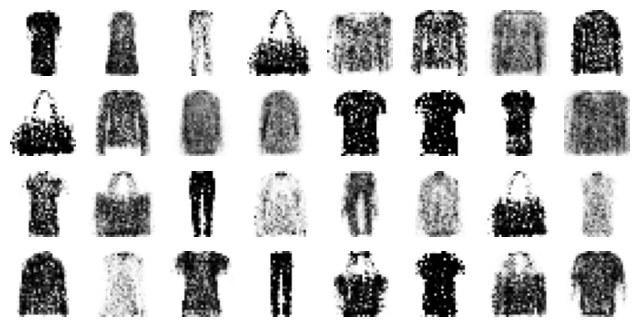

Epoch 17/50


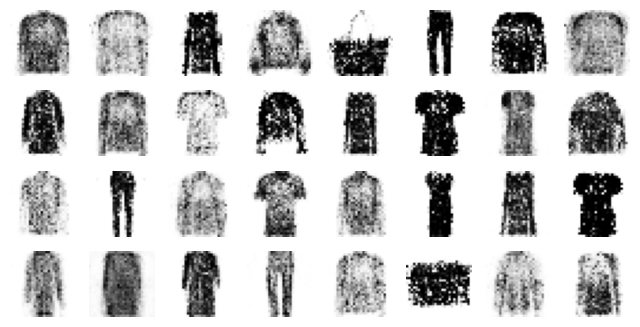

Epoch 18/50


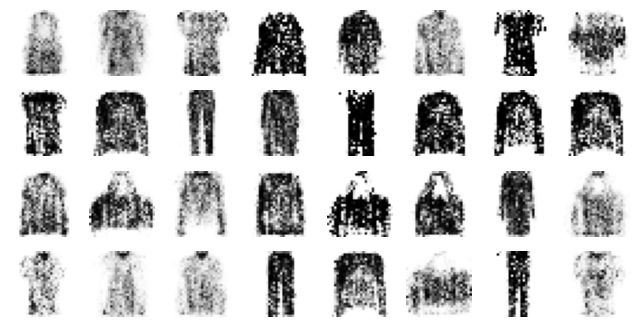

Epoch 19/50


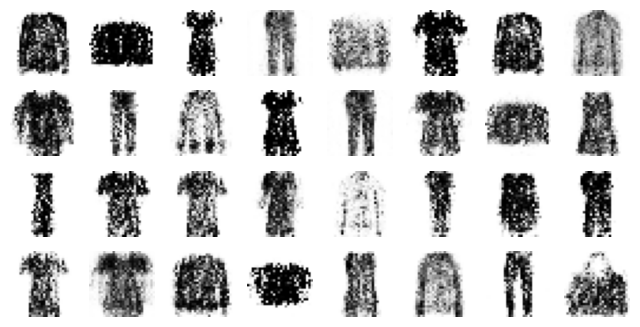

Epoch 20/50


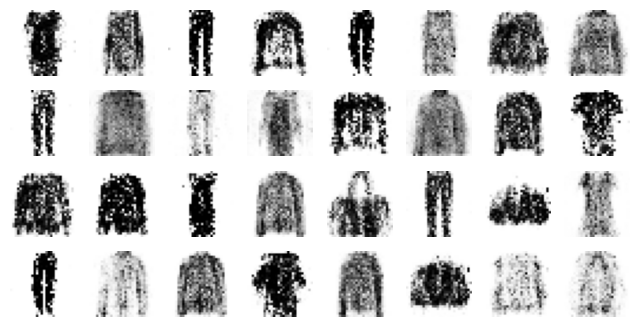

Epoch 21/50


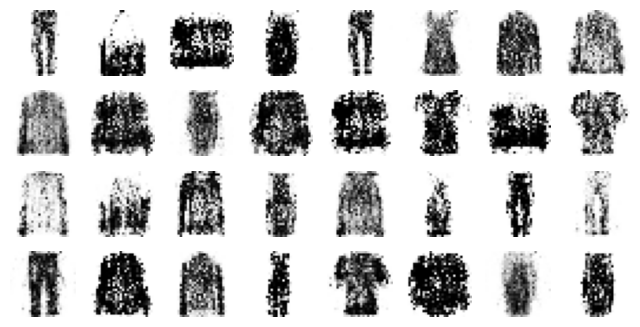

Epoch 22/50


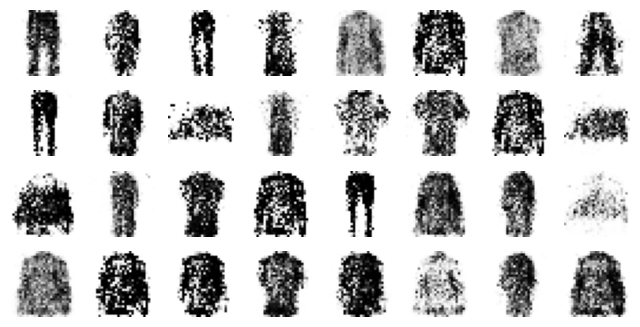

Epoch 23/50


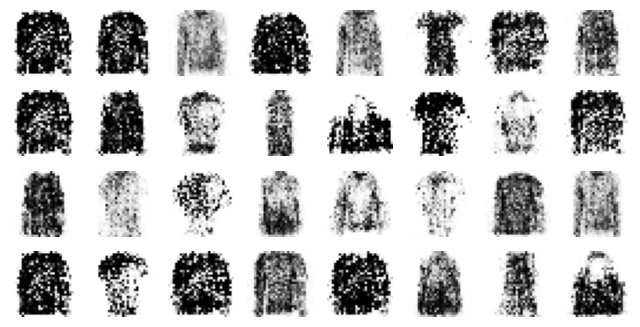

Epoch 24/50


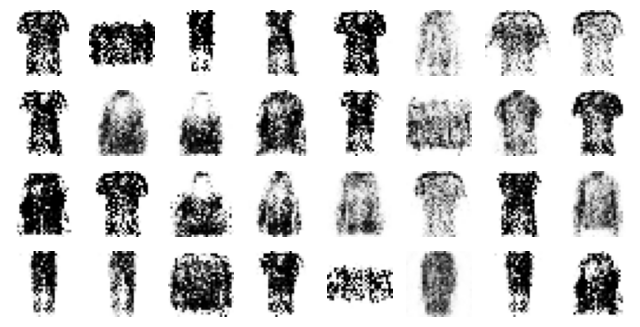

Epoch 25/50


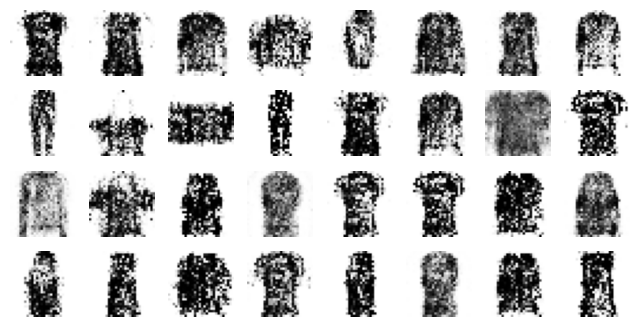

Epoch 26/50


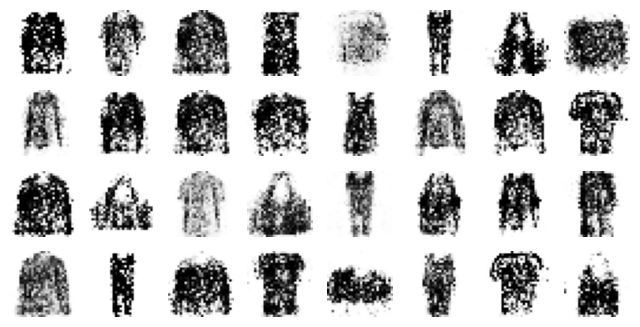

Epoch 27/50


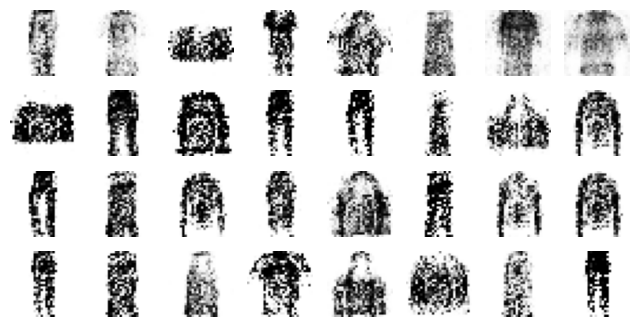

Epoch 28/50


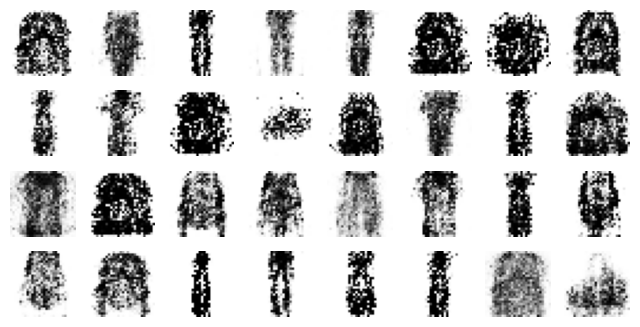

Epoch 29/50


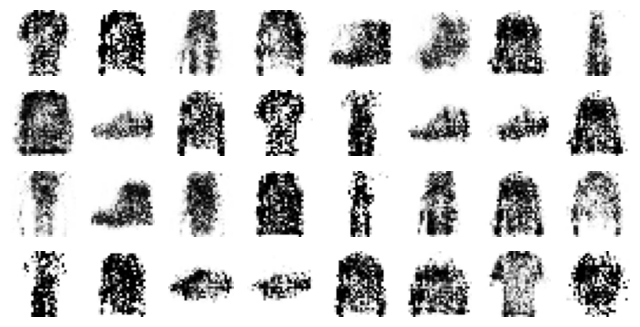

Epoch 30/50


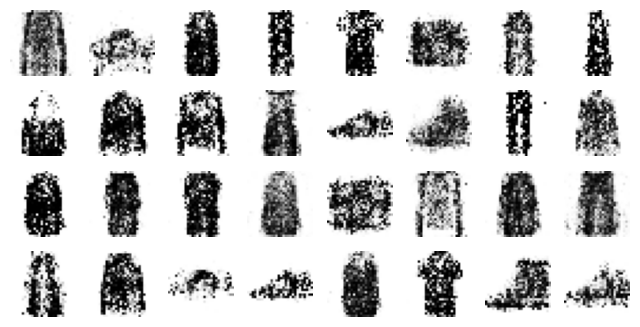

Epoch 31/50


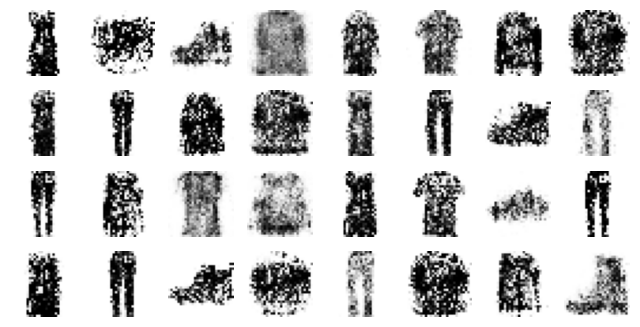

Epoch 32/50


2025-05-25 22:46:54.504510: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


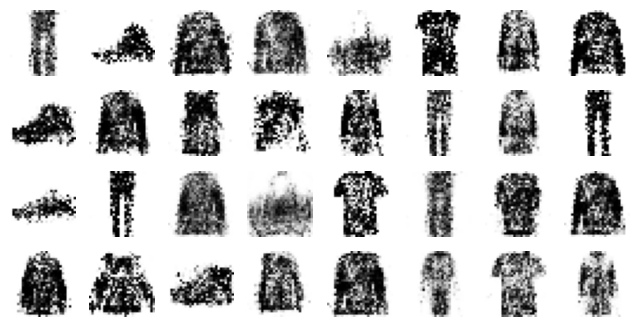

Epoch 33/50


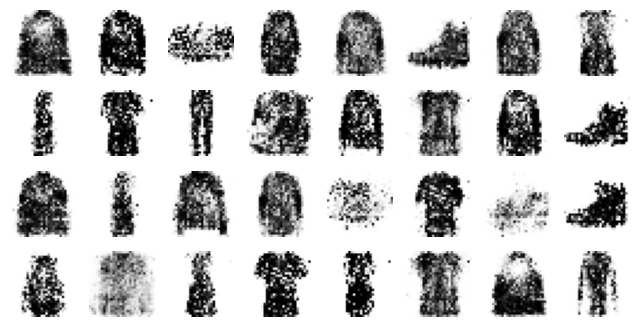

Epoch 34/50


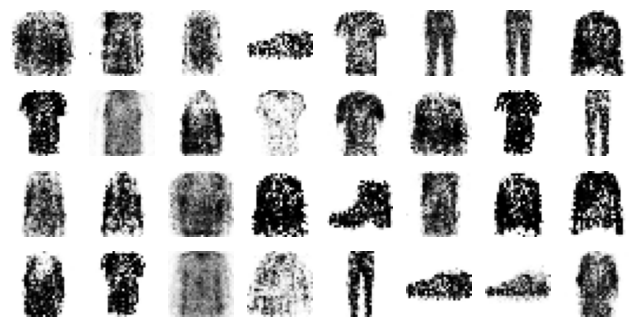

Epoch 35/50


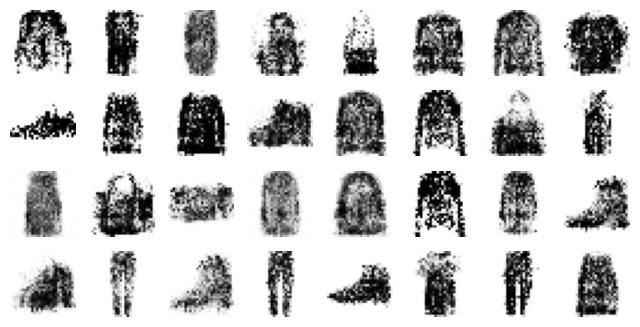

Epoch 36/50


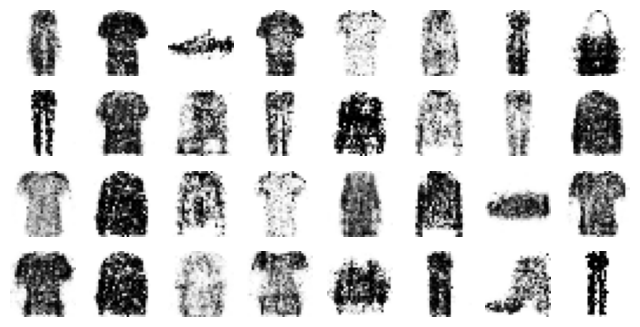

Epoch 37/50


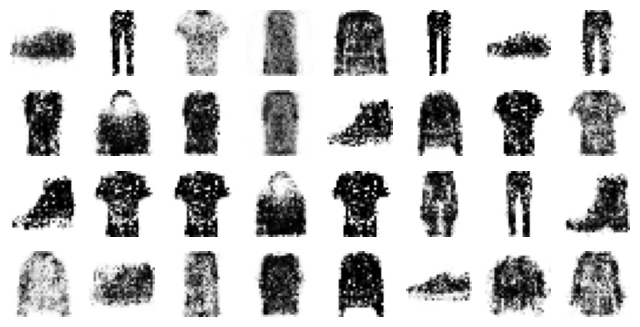

Epoch 38/50


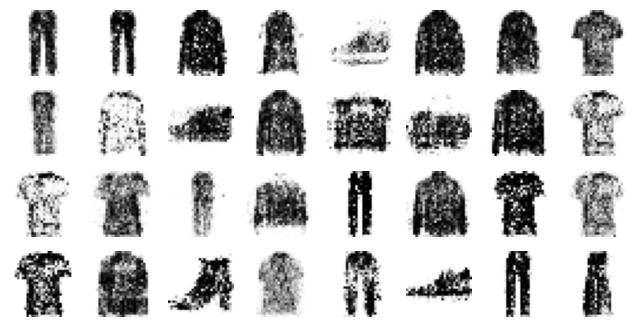

Epoch 39/50


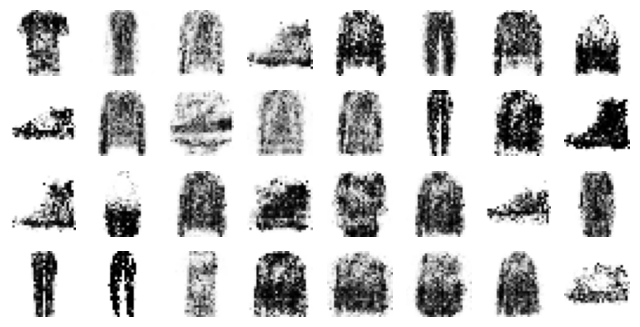

Epoch 40/50


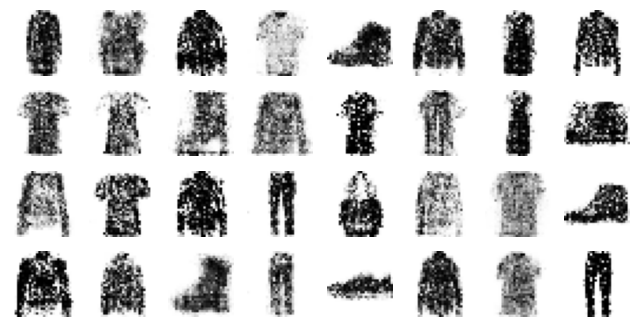

Epoch 41/50


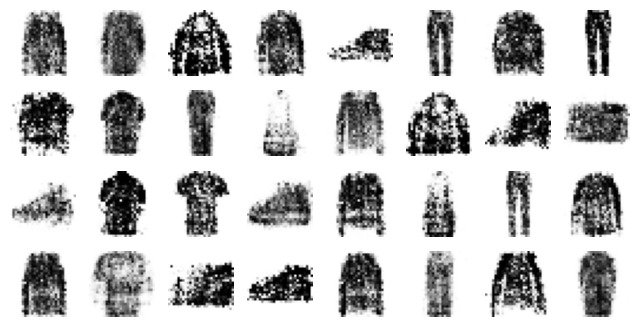

Epoch 42/50


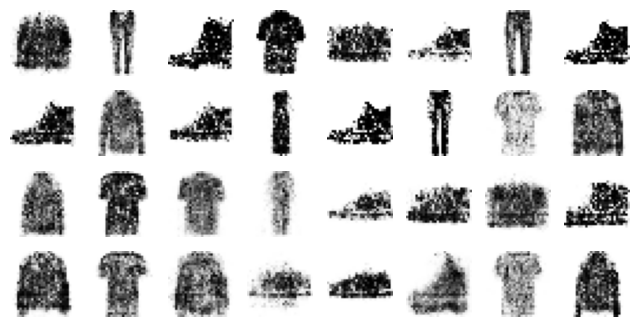

Epoch 43/50


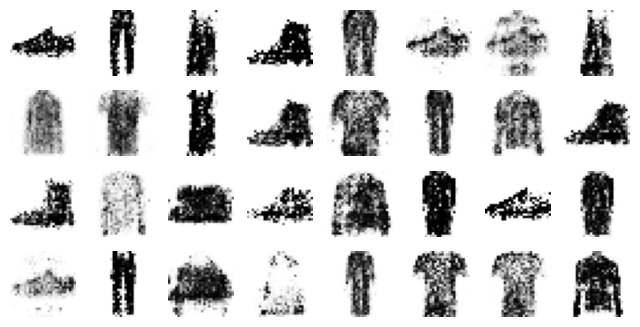

Epoch 44/50


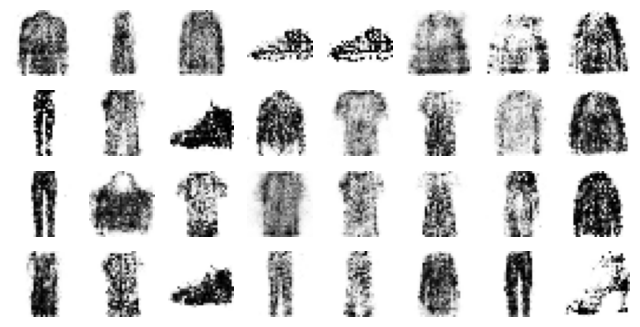

Epoch 45/50


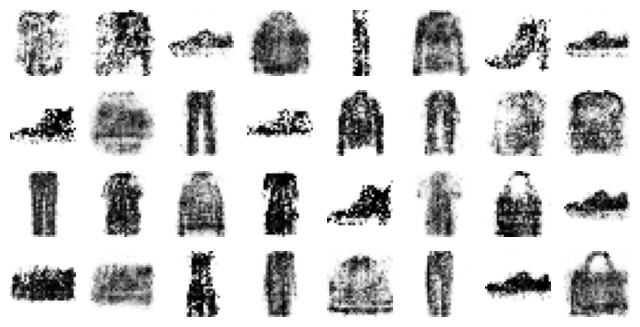

Epoch 46/50


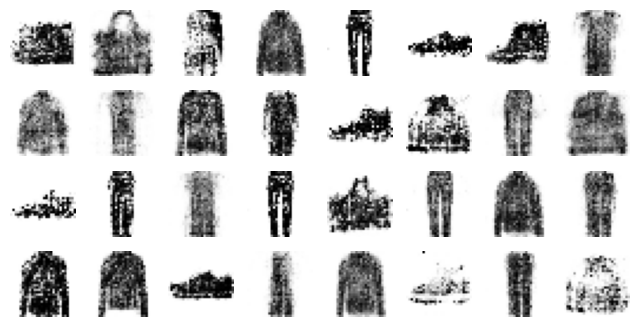

Epoch 47/50


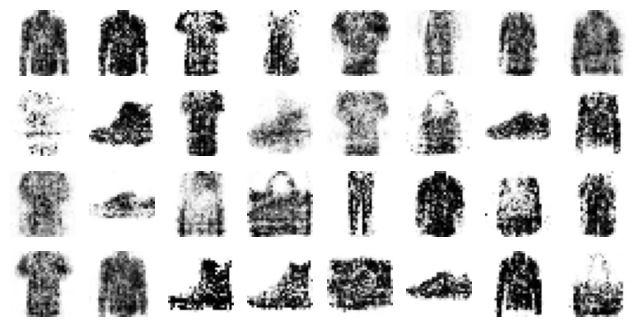

Epoch 48/50


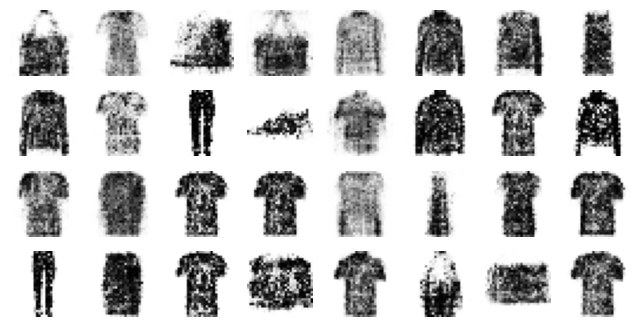

Epoch 49/50


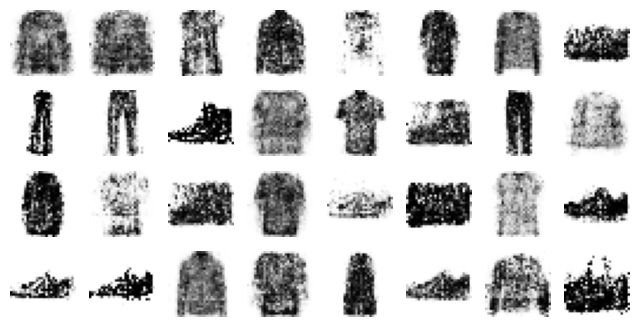

Epoch 50/50


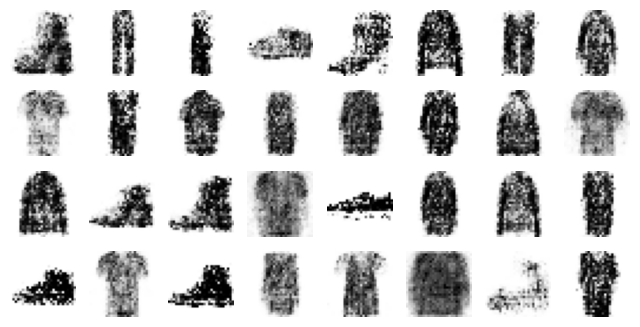

In [ ]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")  # extra code
        for X_batch in dataset:

            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        # extra code — plot images during training
        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()

train_gan(gan, dataset, batch_size, codings_size, n_epochs=50)

新しい画像を生成する

In [ ]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)

1/1 [==============================] - 0s 41ms/step


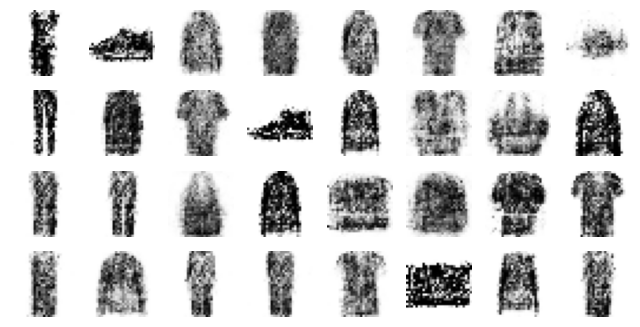

In [ ]:
plot_multiple_images(generated_images, 8)
plt.show()

## 学習がうまくいかない？— モード崩壊（Mode Collapse）
GANの学習には多くの工夫が必要で、その中でもよく起こる問題のひとつが
**モード崩壊（mode collapse）**と呼ばれる現象です。

モード崩壊とは、生成器が限られた種類の画像しか生成しなくなる現象です。
本来は、さまざまなパターン（= モード）の画像を生成してほしい。
しかし、学習が進むにつれて、ある1パターンだけを繰り返し出すようになる。

例：たとえば、手書き数字（MNIST）を生成しているとき：
* 最初はいろいろな数字を出していたのに
* 途中から「数字の3」ばかり生成するようになる

識別器がそれを「本物っぽい」と判定し続けてしまうため、
生成器はその1パターンに固執するようになってしまいます。

### モード崩壊の原因
GANの損失関数は「騙せればそれでよい」という性質がある。
つまり、ある1つのパターンでうまく騙せるようになると、それを繰り返すだけでよいと判断してしまう。
識別器がそれを見抜けない場合、生成器は学習をやめてしまうような状態になる。

### 対処法（概要）
* 識別器の性能を上げる（より細かく違いを見分けられるようにする）
* 生成器に多様性を持たせる損失関数（例：ミニバッチ判別、WGANなど）を導入する
* ハイパーパラメータの調整やモデル構造の工夫

### 観察ポイント
訓練中に以下のような現象が起きたら、モード崩壊の兆候かもしれません：

* 出力画像が毎回「同じようなもの」になる
* 生成画像の種類が増えない（例：常に同じ数字だけ）

## Deep Convolutional GAN (DCGAN)

DCGANは、畳み込みニューラルネットワーク（CNN）を使ったGANの一種で、
従来の「全結合（fully connected）」ベースのGANよりも、画像生成に特化した構造になっています。

2015年に発表されて以来、GANの中でも最もよく使われるモデルのひとつです。

### DCGANの特徴
1. 全結合層を使わない
* 通常のGANでは、生成器・識別器ともにLinear層で構成されていました
* DCGANでは、代わりに Conv2d（識別器）や ConvTranspose2d（生成器） を使用します
  * これにより、画像の**空間的構造（局所的なパターン）**を活かした学習が可能になります

2. 安定した学習のための工夫
* Batch Normalization を使用して、勾配の安定性を向上させる
* 活性化関数には、識別器には LeakyReLU、生成器には ReLU を使うことが推奨されます
* 最後の出力層では、生成器に Tanh を使って、出力値を [-1, 1] に正規化する

### なぜDCGANは優れているのか？
* よりリアルな画像を生成しやすい
* ノイズからの復元やスタイル変換などにも応用しやすい
* 潜在空間の構造が綺麗に学習される傾向がある
  * 例えば、潜在ベクトルを少しずつ変えると「靴 → サンダル → ブーツ」のように連続的に変化する

In [ ]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings_size = 100

generator = tf.keras.Sequential([
    tf.keras.layers.Dense(7 * 7 * 128),
    tf.keras.layers.Reshape([7, 7, 128]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2,
                                    padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2,
                                    padding="same", activation="tanh"),
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same",
                        activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same",
                        activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

Epoch 1/50


E0000 00:00:1748184416.728547    4049 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_4/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


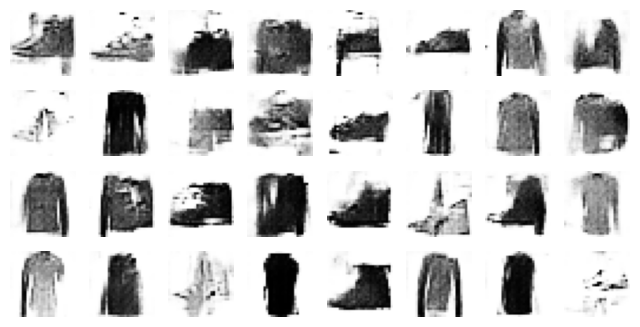

Epoch 2/50


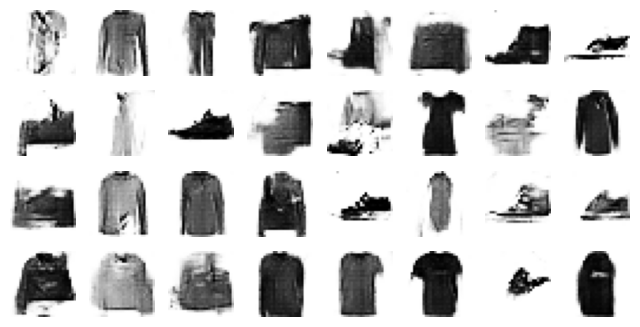

Epoch 3/50


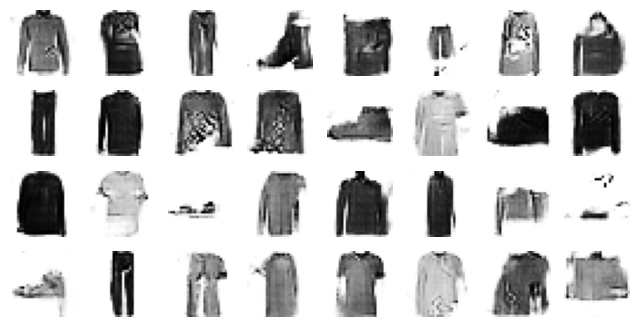

Epoch 4/50


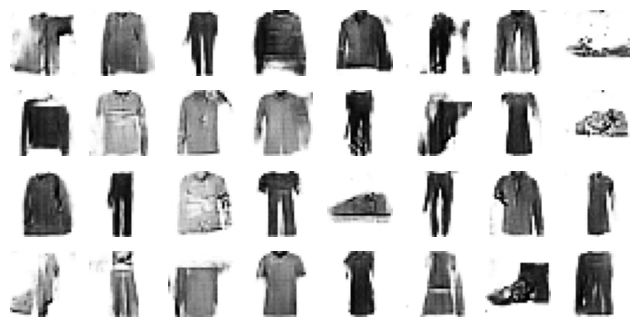

Epoch 5/50


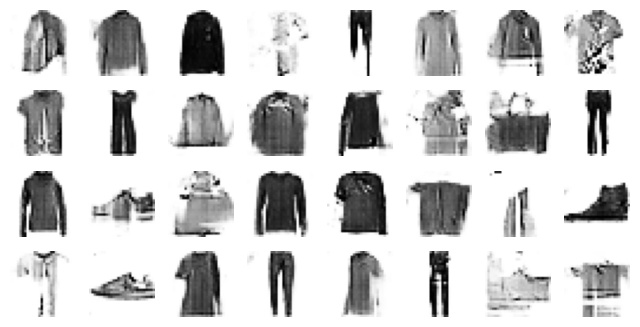

Epoch 6/50


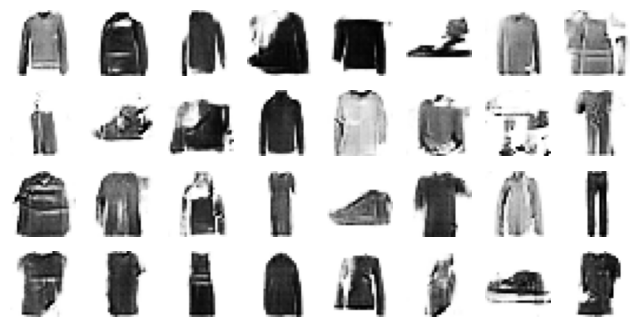

Epoch 7/50


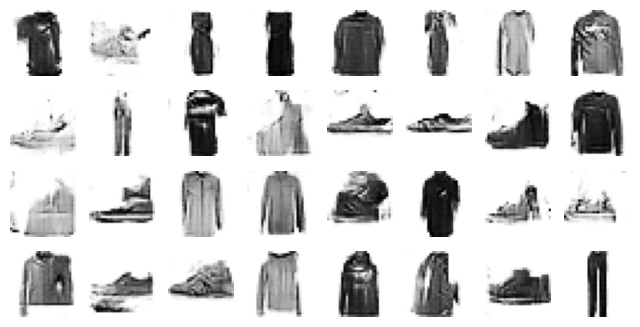

Epoch 8/50


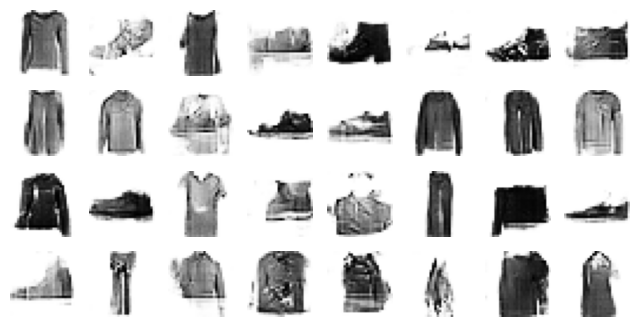

Epoch 9/50


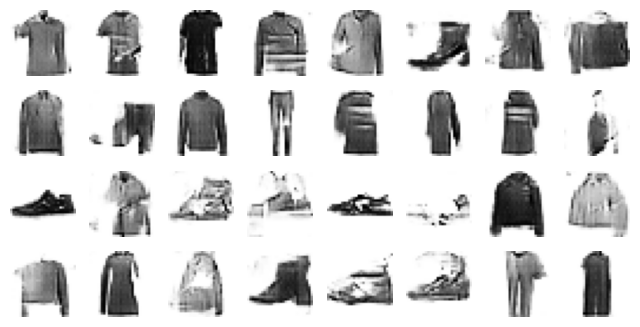

Epoch 10/50


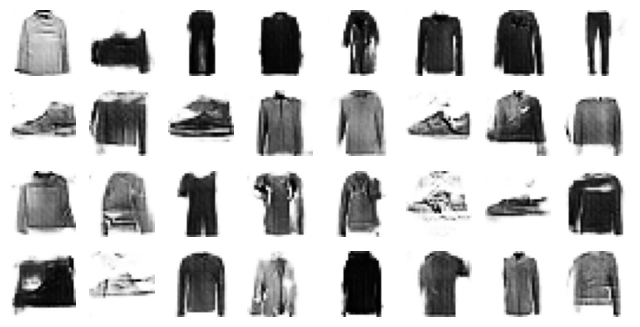

Epoch 11/50


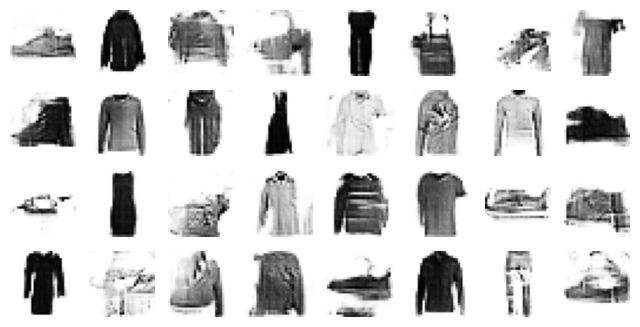

Epoch 12/50


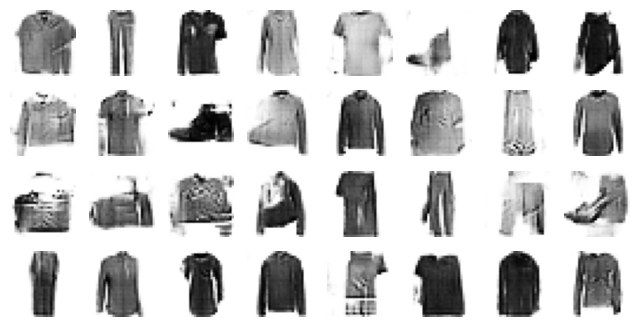

Epoch 13/50


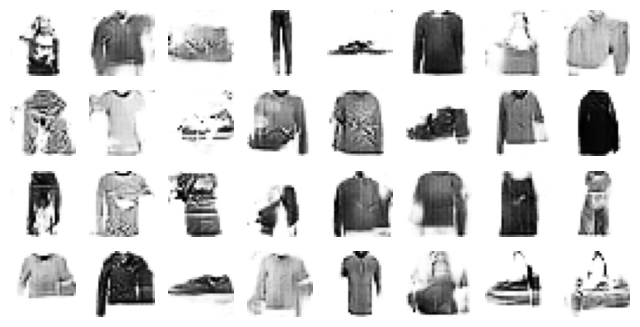

Epoch 14/50


2025-05-25 23:55:08.256539: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


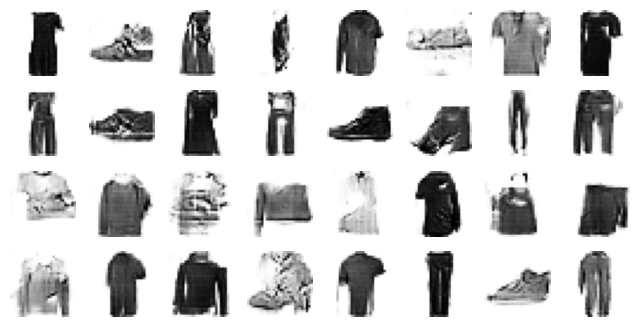

Epoch 15/50


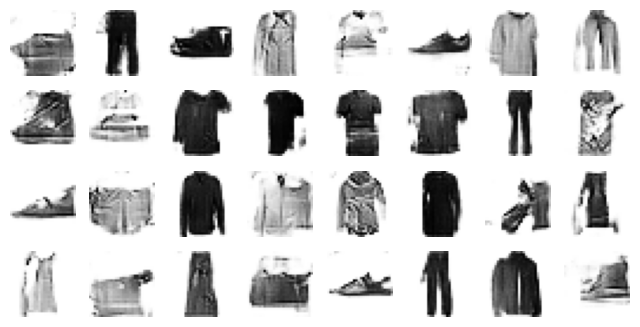

Epoch 16/50


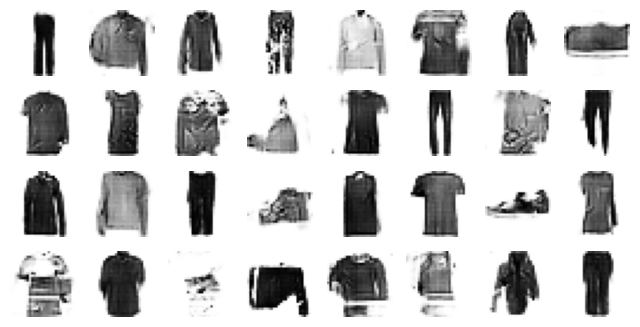

Epoch 17/50


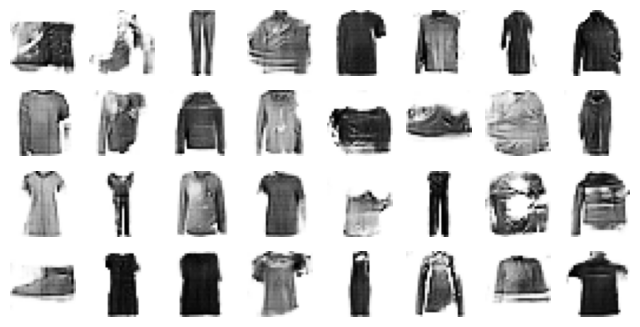

Epoch 18/50


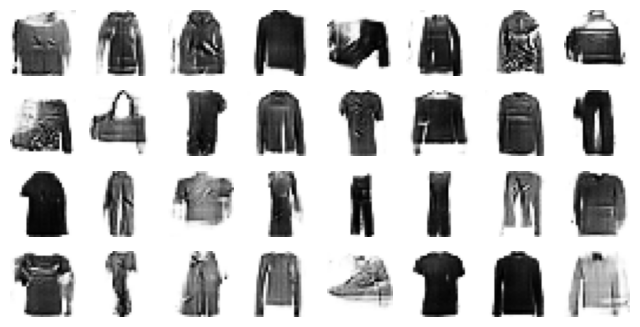

Epoch 19/50


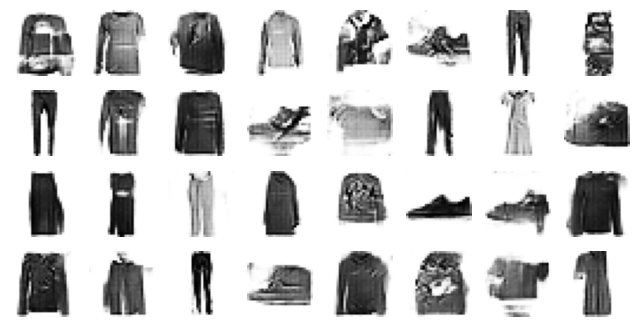

Epoch 20/50


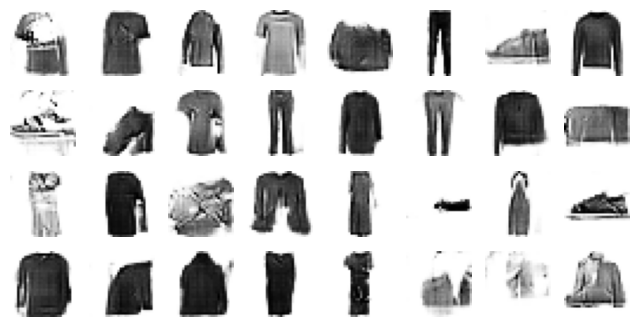

Epoch 21/50


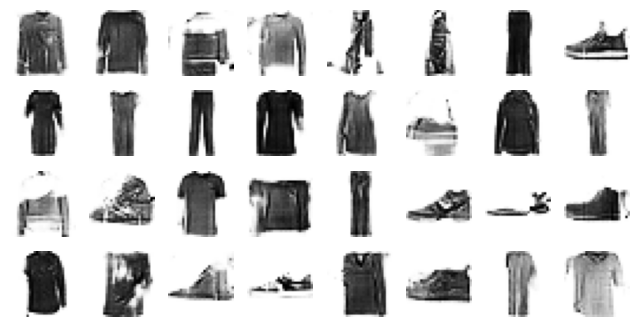

Epoch 22/50


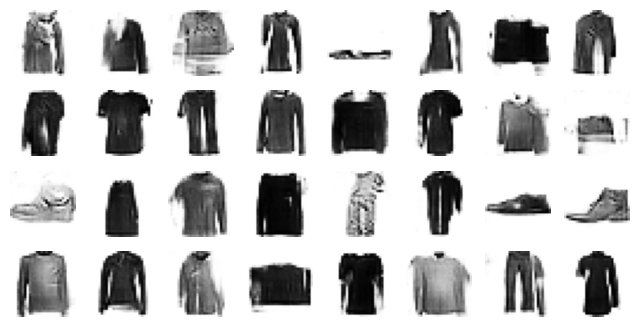

Epoch 23/50


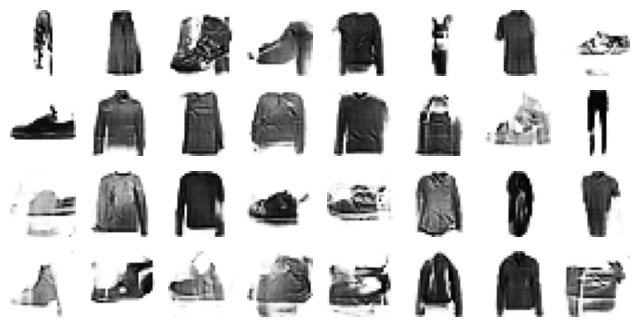

Epoch 24/50


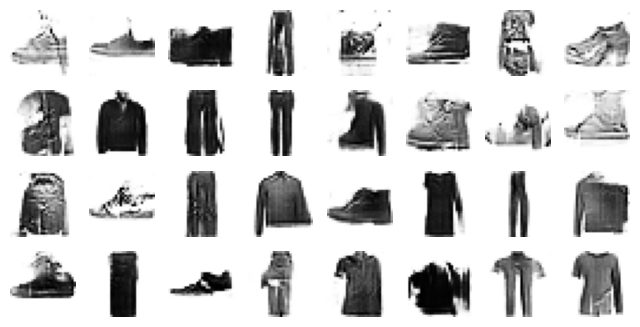

Epoch 25/50


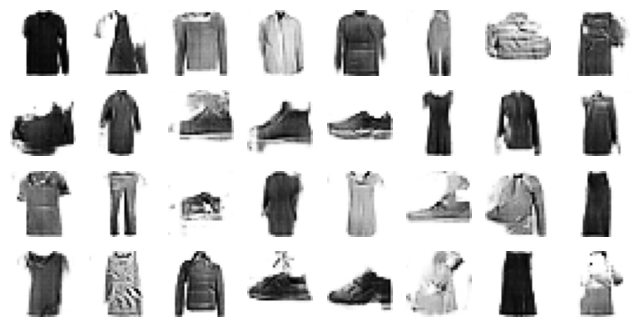

Epoch 26/50


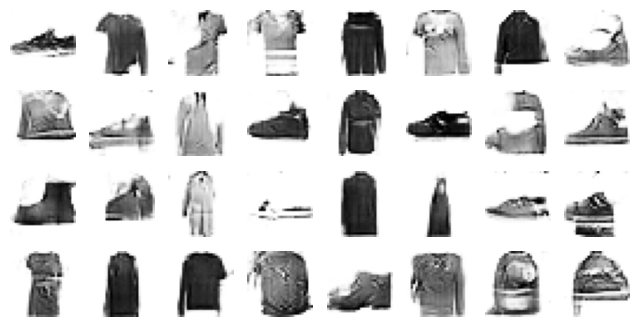

Epoch 27/50


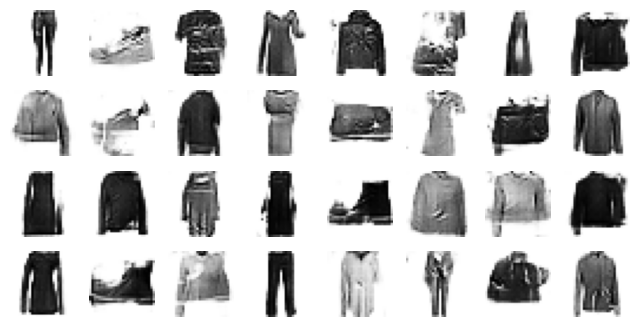

Epoch 28/50


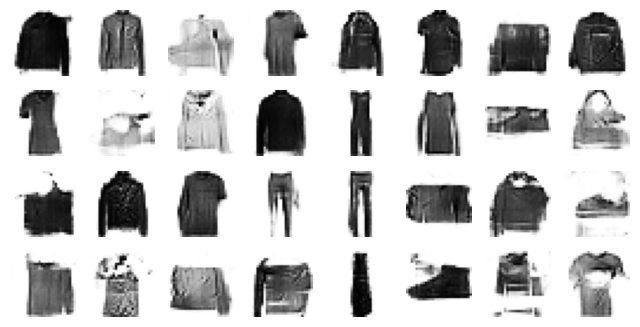

Epoch 29/50


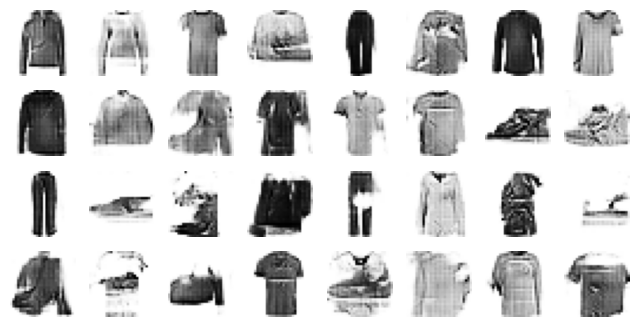

Epoch 30/50


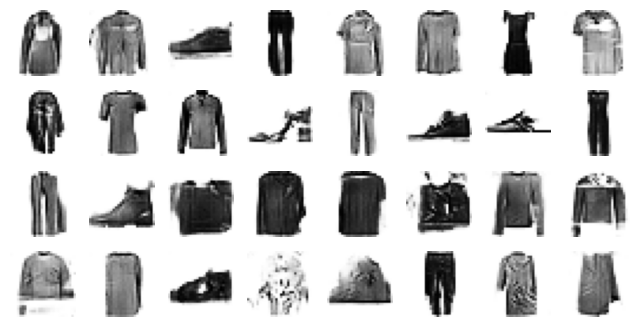

Epoch 31/50


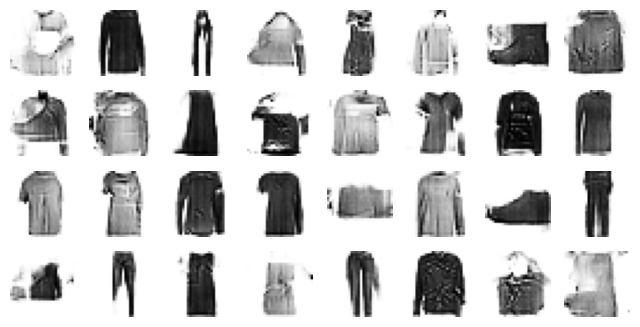

Epoch 32/50


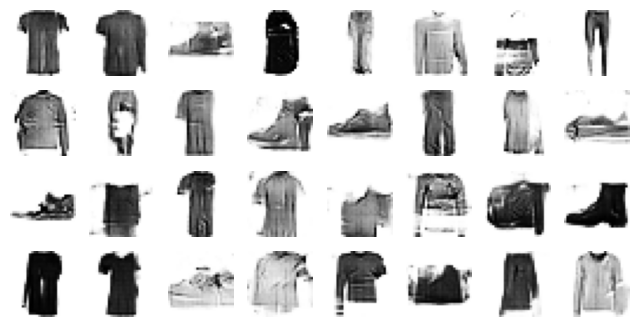

Epoch 33/50


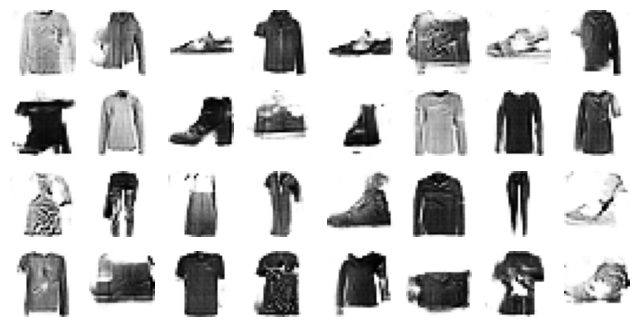

Epoch 34/50


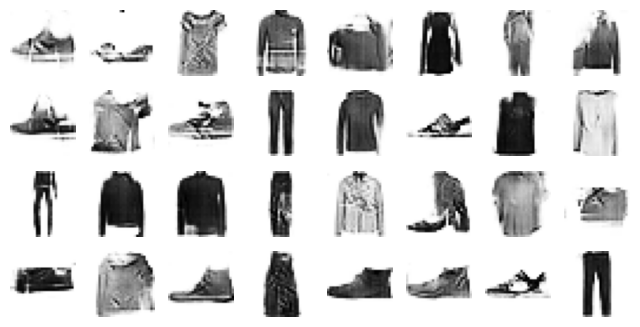

Epoch 35/50


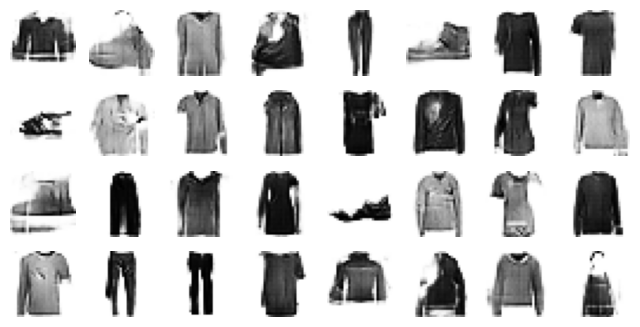

Epoch 36/50


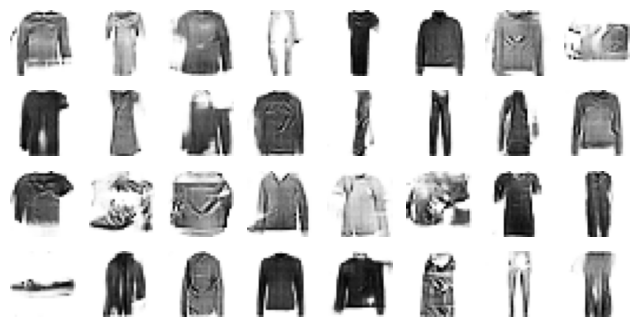

Epoch 37/50


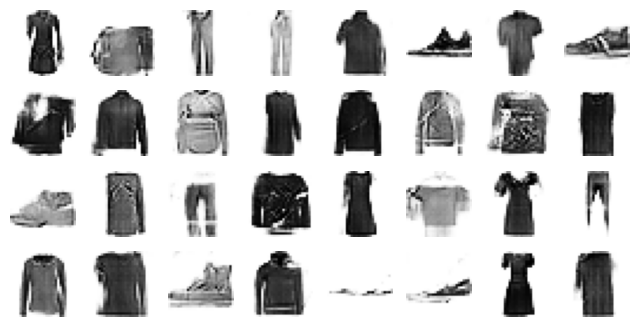

Epoch 38/50


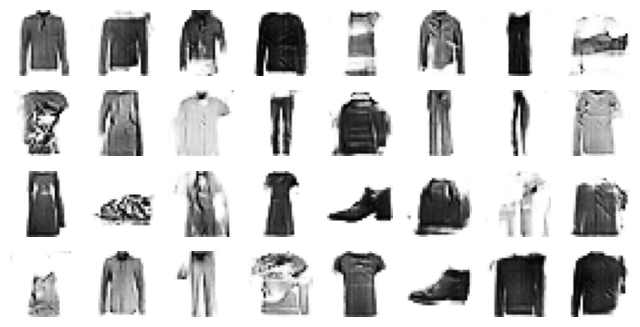

Epoch 39/50


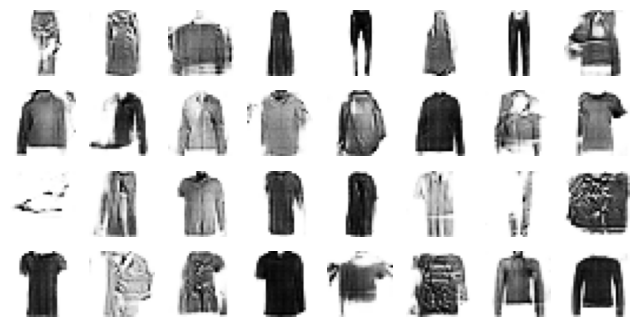

Epoch 40/50


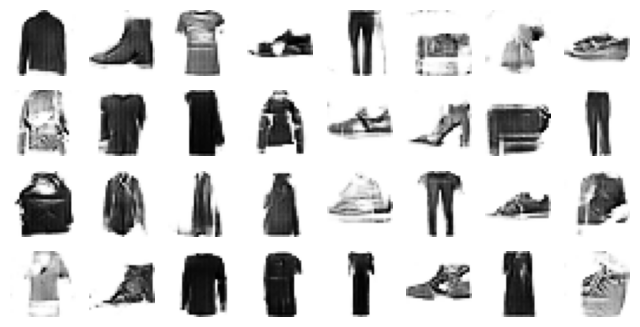

Epoch 41/50


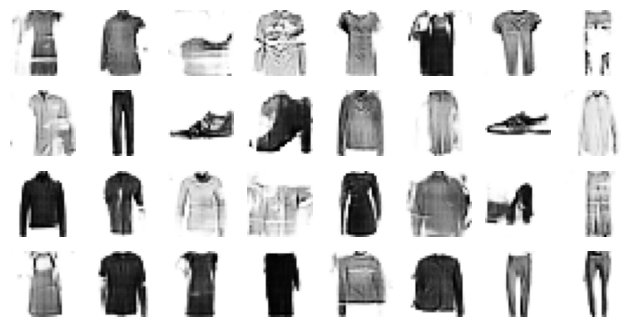

Epoch 42/50


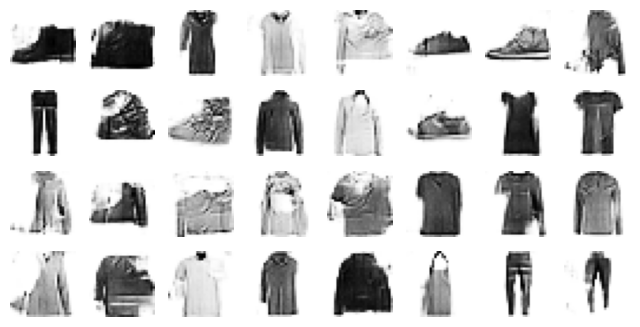

Epoch 43/50


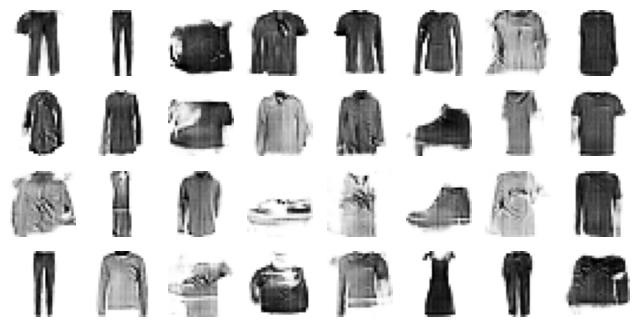

Epoch 44/50


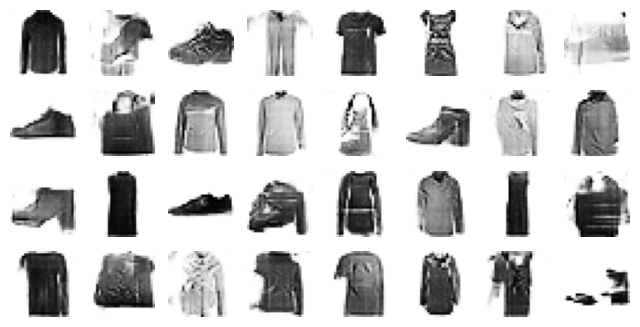

Epoch 45/50


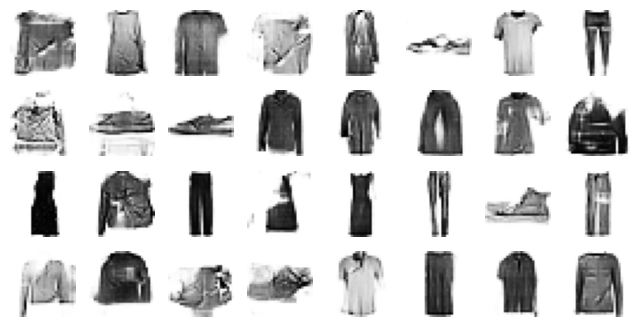

Epoch 46/50


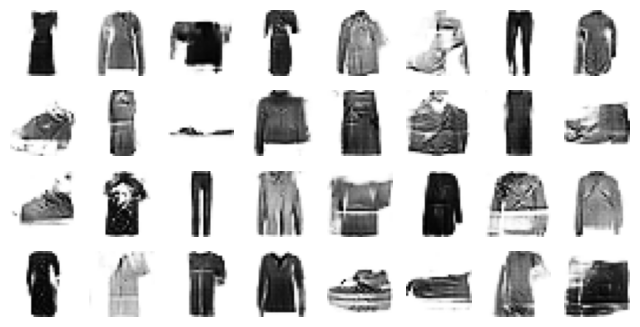

Epoch 47/50


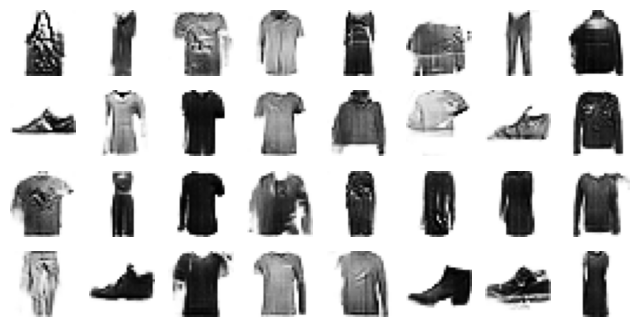

Epoch 48/50


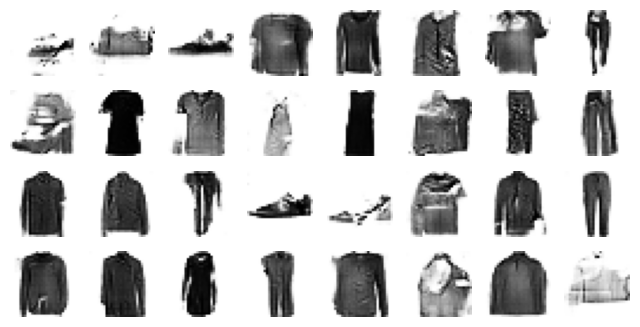

Epoch 49/50


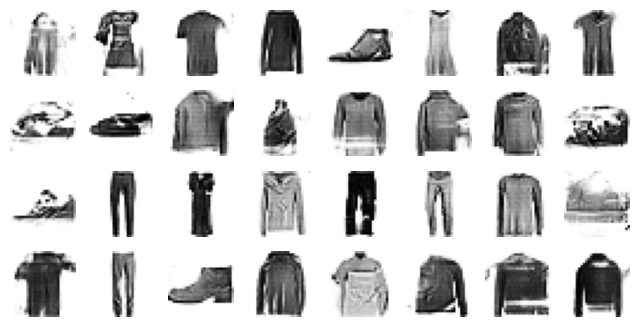

Epoch 50/50


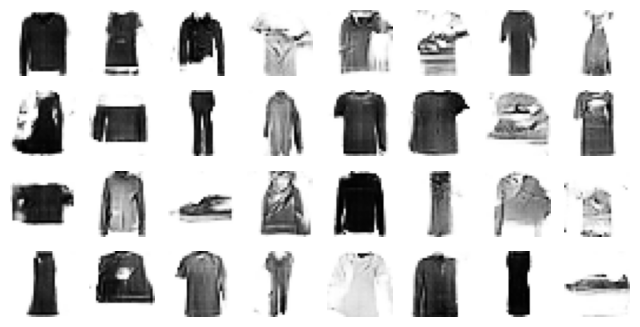

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)
train_gan(gan, dataset, batch_size, codings_size, n_epochs=50)

1/1 [==============================] - 0s 274ms/step


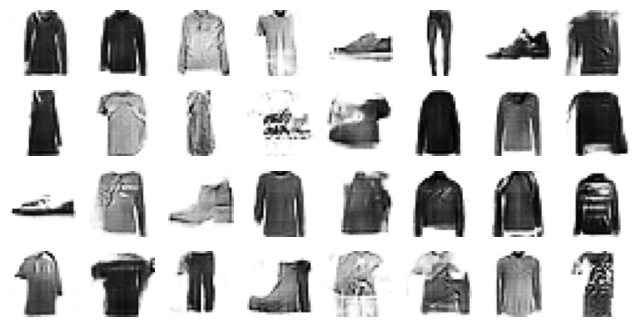

In [ ]:
tf.random.set_seed(42)
noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(noise)
plot_multiple_images(generated_images, 8)

## 面白い GAN による生成 AI サイト
StyleGAN というモデルで生成した人の顔「写真」：

https://thispersondoesnotexist.com/

もうひとつ StyleGAN で生成している偽の AirBnB サイト

https://thisrentaldoesnotexist.com/